# Notebook 概要：
主要探索groupby下的商店分布与序列走势
- 第一部分：探索商店的groupby
- 第二部分：对一家商店提取特征训练
- 第三部分：对一个group提取特征训练
- 第四部分：对一个group内聚类再提取特征训练

## 第一部分：

In [2]:
#!/usr/bin/env python
# coding=utf-8
# -------- import basic package --------
%pylab inline
import pdb
import numpy as np
import pandas as pd
from pandas import Series, DataFrame
import warnings
from datetime import datetime
import matplotlib.pylab as plt

PATH = 'F:/codeGit/dataset/koubei/dataset/'
FILE_SHOP = 'shop_info.csv'
FILE_PAY = 'df_shopPay.csv'
FILE_PAY_FULL = 'df_shopPay_fillna.csv'
FILE_VIEW_FULL = 'df_view_fillna.csv'

warnings.filterwarnings("ignore")

Populating the interactive namespace from numpy and matplotlib


In [3]:
df_shop = pd.read_csv(PATH + FILE_SHOP)
# 处理cate_name缺失
df_shop['cate_3_name'] =  df_shop['cate_3_name'].fillna(df_shop['cate_2_name'])
print df_shop[:5]
df_view = pd.read_csv(PATH + FILE_VIEW_FULL)
df_pay = pd.read_csv(PATH + FILE_PAY_FULL)

df_view['date'] = pd.to_datetime(df_view['date'], format = '%Y-%m-%d')
df_pay['date'] = pd.to_datetime(df_pay['date'], format = '%Y-%m-%d')
df_view['view_cnt'] =  df_view['view_cnt'].apply(lambda x: int(x))
df_pay['user_pay_cnt'] =  df_pay['user_pay_cnt'].apply(lambda x: int(x))
print df_view[:5]
print df_pay[:5]

   shop_id city_name  location_id  per_pay  score  comment_cnt  shop_level  \
0        1        湖州          885        8    4.0         12.0           2   
1        2       哈尔滨           64       19    NaN          NaN           1   
2        3        南昌          774        5    3.0          2.0           0   
3        4        天津          380       18    NaN          NaN           1   
4        5        杭州          263        2    2.0          2.0           0   

  cate_1_name cate_2_name cate_3_name  
0          美食        休闲茶饮       饮品/甜点  
1       超市便利店          超市          超市  
2          美食        休闲茶饮          奶茶  
3       超市便利店          超市          超市  
4          美食        休闲食品        生鲜水果  
   shop_id       date  view_cnt
0        1 2016-02-01         6
1        1 2016-02-02         9
2        1 2016-02-03         6
3        1 2016-02-04         8
4        1 2016-02-05         6
   shop_id       date  user_pay_cnt
0        1 2015-10-10           188
1        1 2015-10-11      

In [5]:
list_cast3name = df_shop['cate_3_name'].unique().tolist()
print df_shop.iloc[0]['cate_3_name'] == list_cast3name[0]

True


饮品/甜点


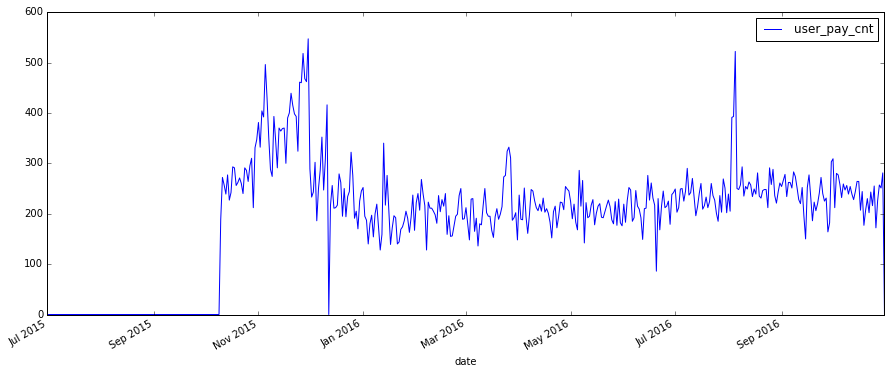

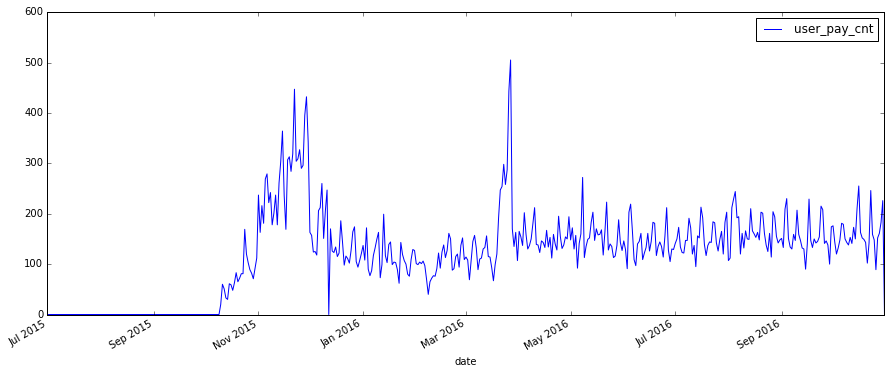

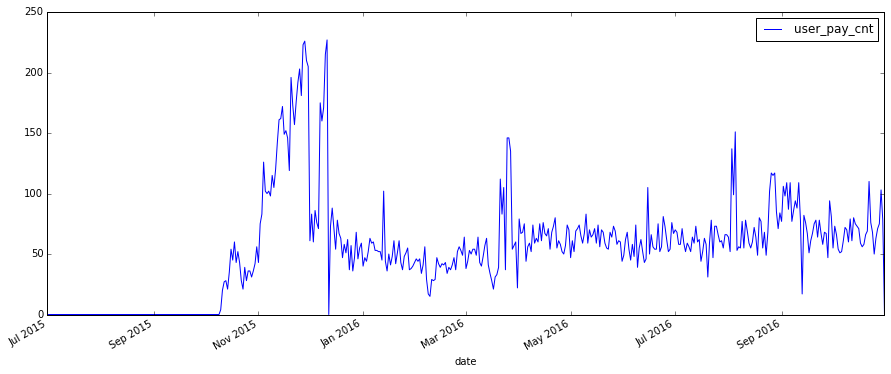

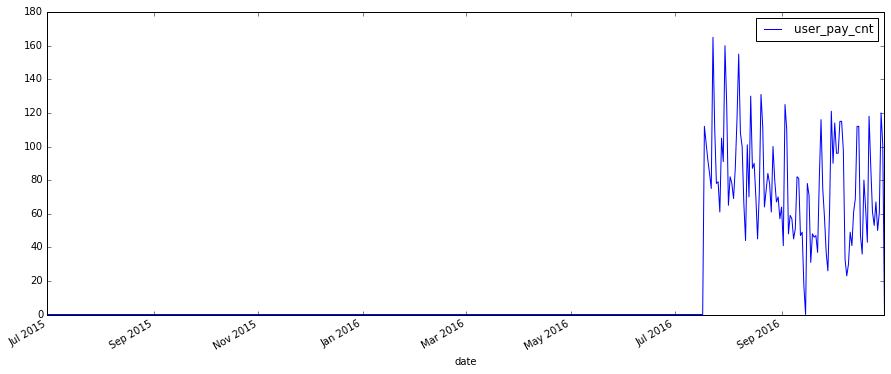

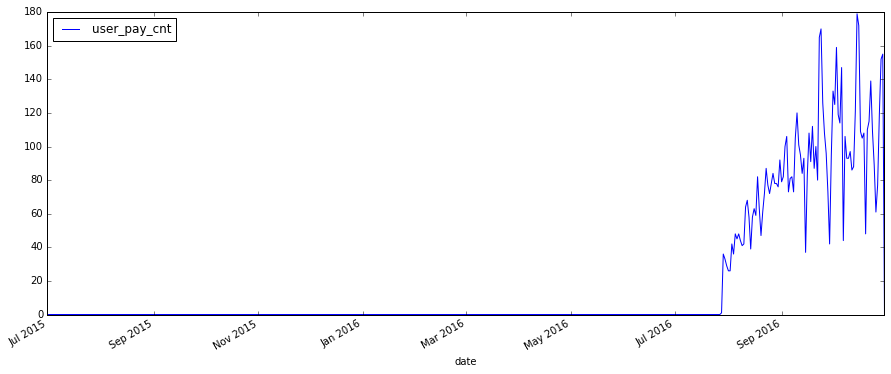

...

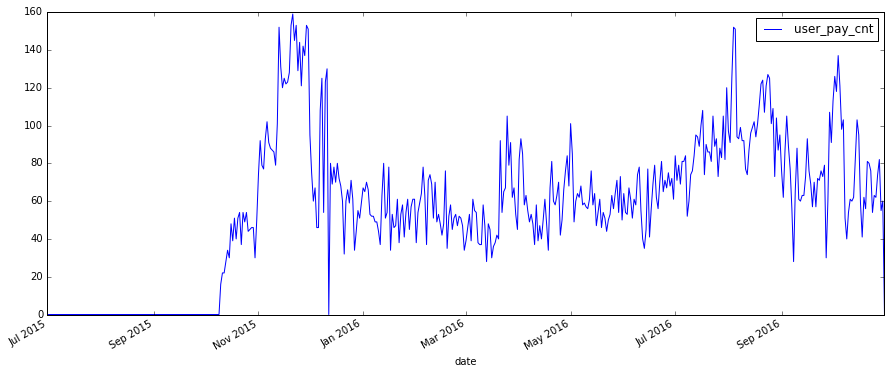

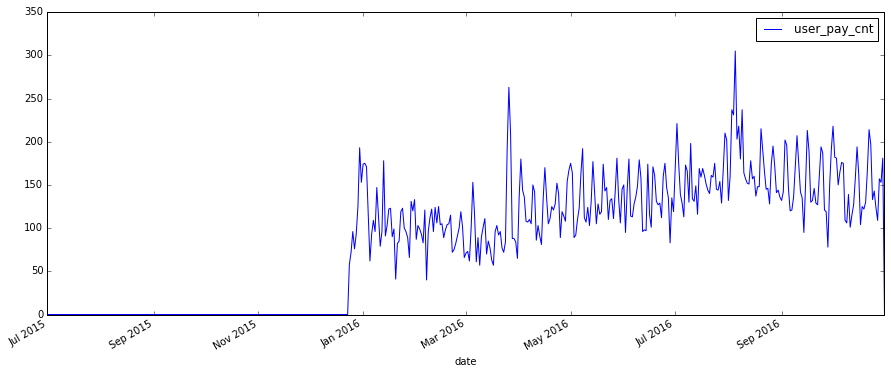

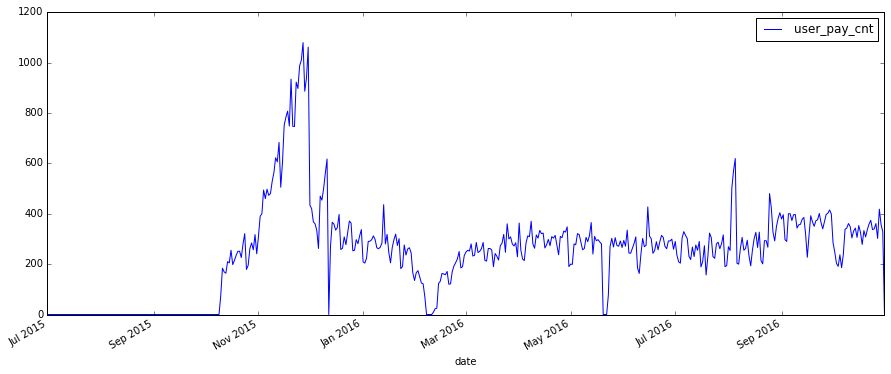

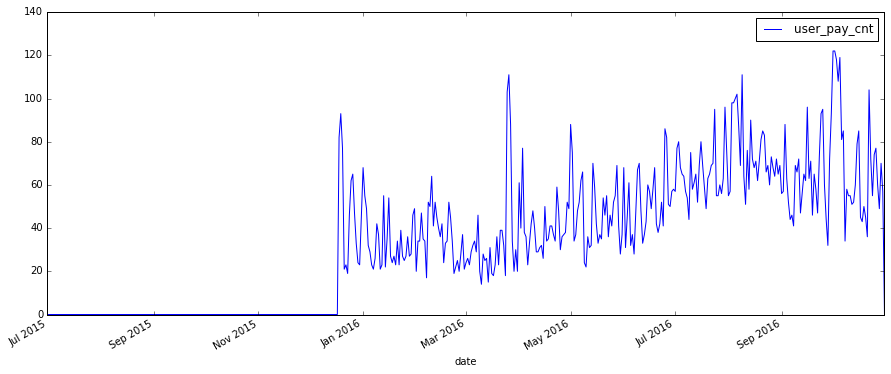

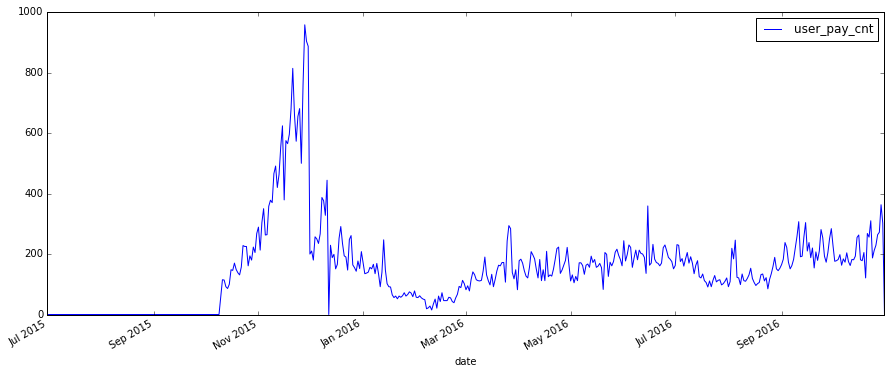

In [6]:
# 选取一商户的信息进行分析
shop_type = list_cast3name[0]
print shop_type
for id in df_shop['shop_id']:
    df_shop1 = df_pay[df_pay.shop_id == id]
    if df_shop.iloc[id - 1]['cate_3_name'] == shop_type:
        df_shop1.index = df_shop1['date']
        df_shop1[['date', 'user_pay_cnt']].plot(kind='line', figsize=(15, 6)) 
        # 如上选择商户在1月份的客流量进行分析
        # df_shop1_jan = df_shop1[(df_shop1.date >= '2016-01-01') & (df_shop1.date < '2016-4-01')]
        # df_shop1_jan[['date', 'user_pay_cnt']].plot(kind='line', figsize=(15, 4)) 
        

上面显示的都是cast3属性为饮品/甜点的所有商店，可以看出这类店刚开张客流都会明显上升，最后趋于平稳抖动。偶尔有一些冲击部分，初步判定冲击点日期可能为节假日或特殊日子：如情人节、光棍节，学校开学等。故有以下启示：  
- 1、计算所在预测日期与开业时间的时间差距，可做为特征之一
- 2、对进行回归时，有必要找出一年所有的节日与特殊日子，以设定节日特征

超市


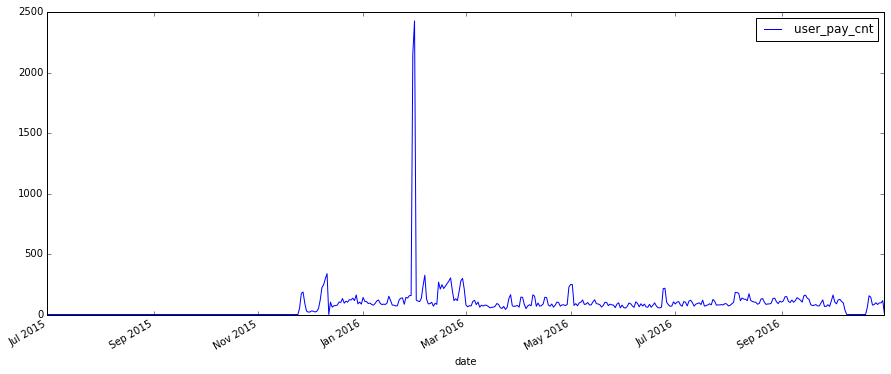

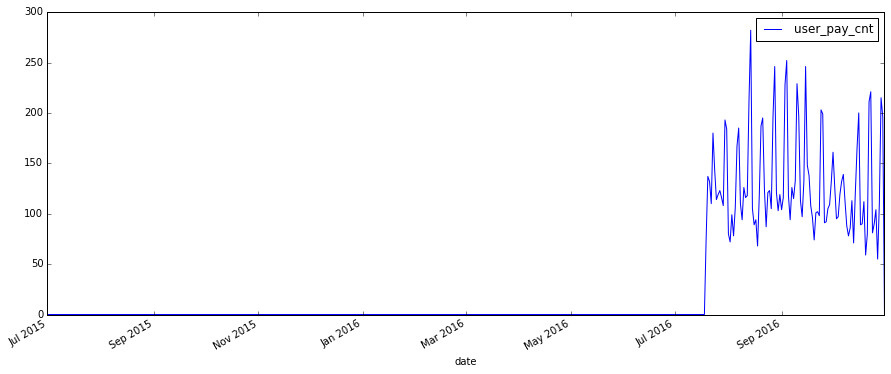

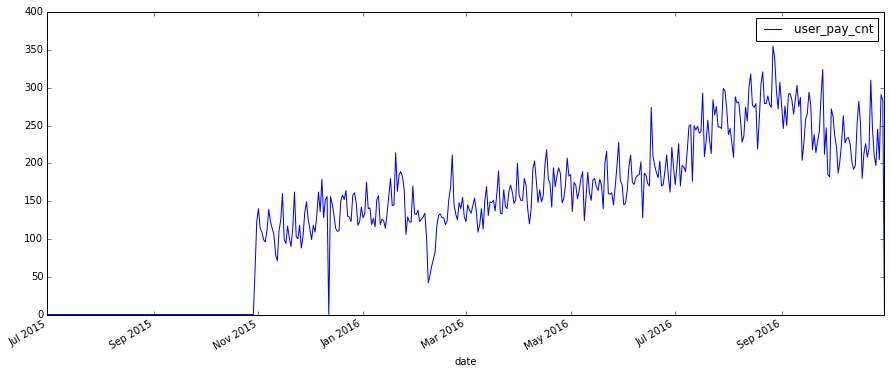

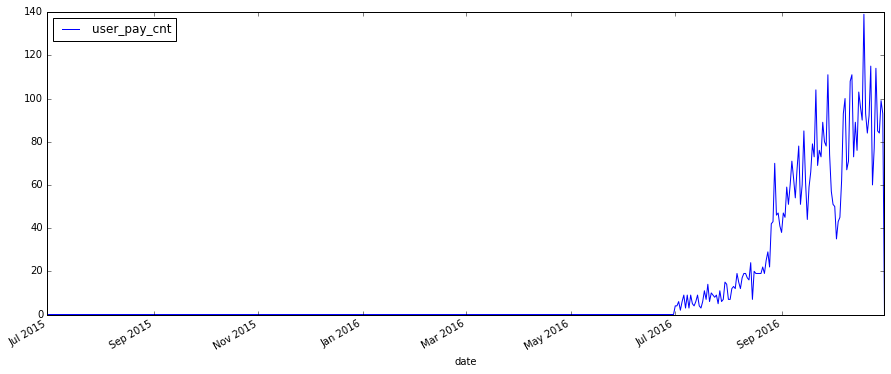

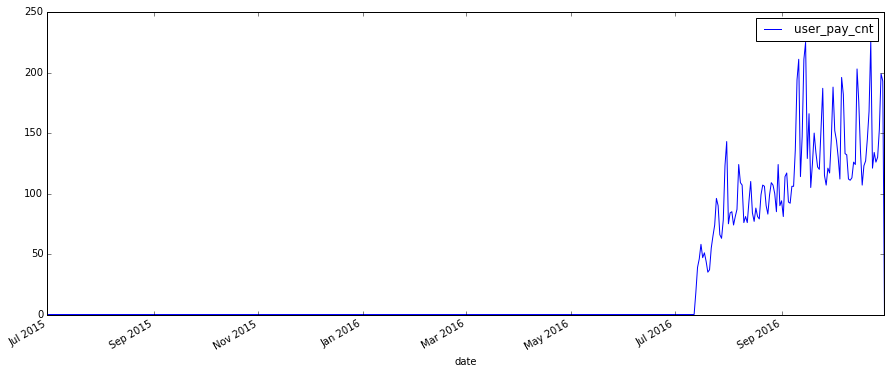

...

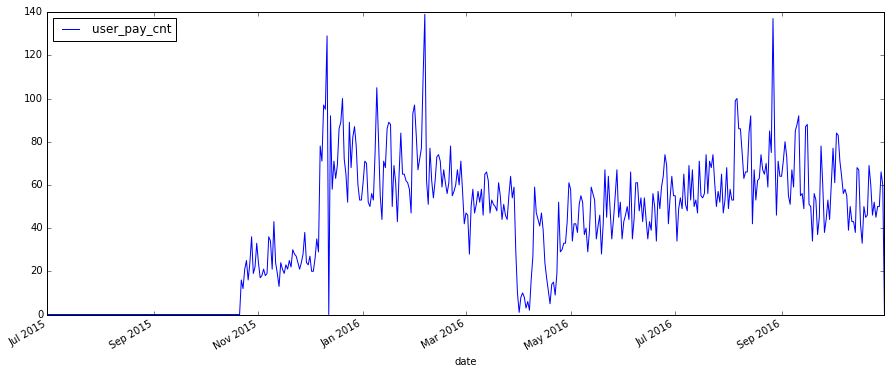

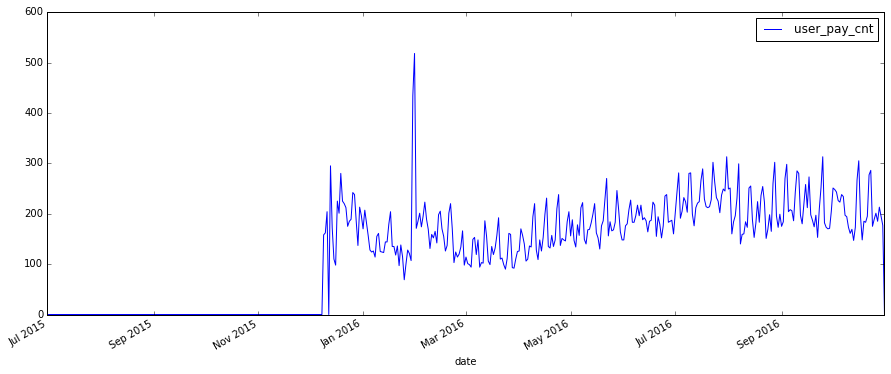

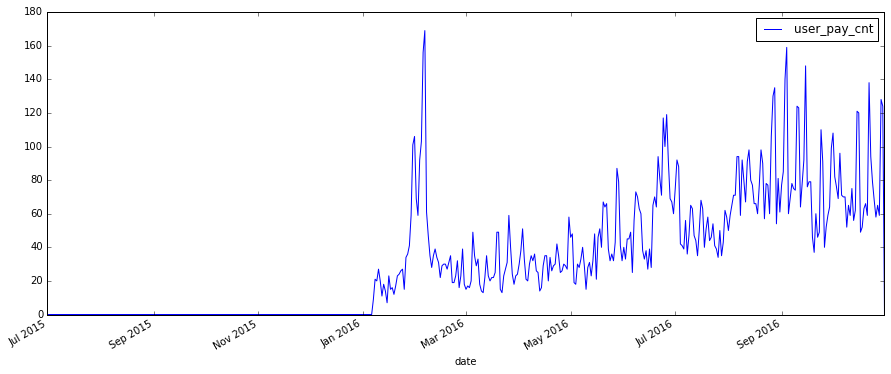

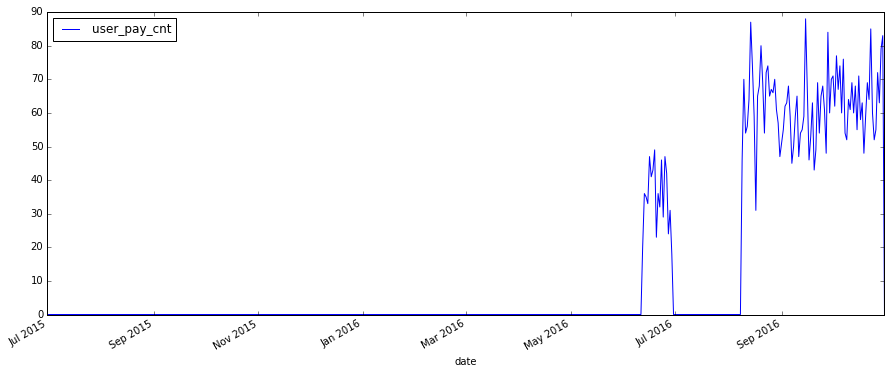

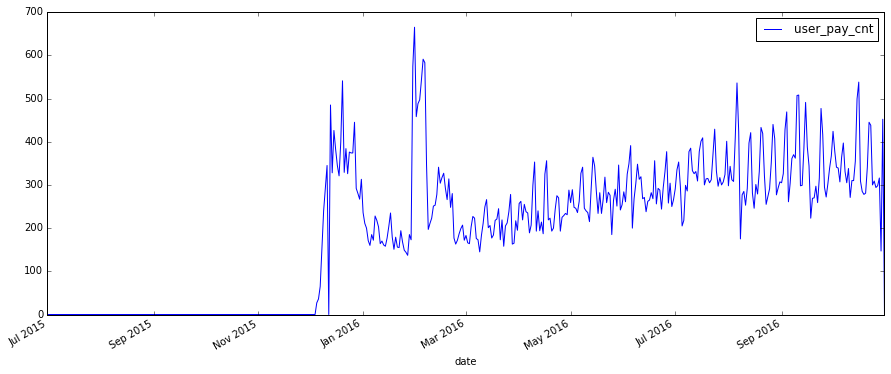

In [7]:
# 选取一商户的信息进行分析
shop_type = list_cast3name[1]
print shop_type
for id in df_shop['shop_id']:
    df_shop1 = df_pay[df_pay.shop_id == id]
    if df_shop.iloc[id - 1]['cate_3_name'] == shop_type:
        df_shop1.index = df_shop1['date']
        df_shop1[['date', 'user_pay_cnt']].plot(kind='line', figsize=(15, 6)) 
        # 如上选择商户在1月份的客流量进行分析
        # df_shop1_jan = df_shop1[(df_shop1.date >= '2016-01-01') & (df_shop1.date < '2016-4-01')]
        # df_shop1_jan[['date', 'user_pay_cnt']].plot(kind='line', figsize=(15, 4)) 

如上关于超市类与饮品类的商店比较，可以发现一些特殊的时间段，如新年是歇业的，即表现为缺失。而对于一些缺少的点，又属于商店临时歇业所致，这些是属于噪声点，应该予以估计并填补。采用策略为判断同类中的该日期缺失的比重，当比重小于一定阈值时，使用该点的前后点的平均值来代替；否则不改变  
由于最后估计的值为14天，则滑窗的长度可以设置为14天的倍数长度。

由上初定特征为：
- 星期几特征、月份特征、是否工作日、月初月末特征
- 节日第几天、节前后特征、是否调休、开学特征
- 距离新开业时间、天气特征、温度特征
- 商店等级、平均消费、评分、评论数

前三组是动态特征，以预测客流量抖动；且除了距离新开业时间为商户特征，其余均为公共特征  
后三组是商店的静态特征，以预测商店的平均客流量

## 第二部分：

### 对一个group里的一个商户提取特征

In [61]:
# 精细时间参数提取函数
def fit_date_mess(df):
    df['weekday'] = df['date'].dt.weekday
    df['month'] = df['date'].dt.month
    df['day_in_month'] = df['date'].dt.day
    return df
    # 根据调休表调整    

In [62]:
# 选取一个group中的一商户的信息进行分析
shop_type = list_cast3name[0]
print shop_type
for id in df_shop['shop_id']:
    df_shop1 = df_pay[df_pay.shop_id == id]
    if df_shop.iloc[id - 1]['cate_3_name'] == shop_type:
        df_shop1.index = df_shop1['date']
        break        
# 补充必要的信息
df_shop1 = fit_date_mess(df_shop1)

饮品/甜点


In [63]:
print df_shop1[:5]

            shop_id       date  user_pay_cnt cate_3_name  weekday  month  \
date                                                                       
2015-10-10        1 2015-10-10           188       饮品/甜点        5     10   
2015-10-11        1 2015-10-11           272       饮品/甜点        6     10   
2015-10-12        1 2015-10-12           257       饮品/甜点        0     10   
2015-10-13        1 2015-10-13           239       饮品/甜点        1     10   
2015-10-14        1 2015-10-14           277       饮品/甜点        2     10   

            day_in_month  
date                      
2015-10-10            10  
2015-10-11            11  
2015-10-12            12  
2015-10-13            13  
2015-10-14            14  


#### 提取开业特征

In [64]:
# 获取开业时间特征
df_pay_withNan = pd.read_csv(PATH + FILE_PAY)
opening_day = df_pay_withNan[df_pay_withNan.shop_id == df_shop1.iloc[0].shop_id]['date'].min()

df_shop1['days_from_opening'] = (df_shop1['date'] - pd.to_datetime(opening_day)).dt.days

#### 提取工作日、月前月末特征

In [65]:
# 获得工作日、月前月末特征
df_shop1['is_workday'] = df_shop1['weekday'].apply(lambda x : 0 if x >= 5 else 1)
df_shop1['is_month_begin'] = df_shop1['day_in_month'].apply(lambda x : 1 if x <= 5 else 0)
df_shop1['is_month_end'] = df_shop1['day_in_month'].apply(lambda x : 1 if x >= 26 else 0)

In [66]:
# 2016年的假日表
holiday_list = ['2016-01-01', '2016-02-22', 
                '2016-04-02', '2016-04-03', '2016-04-04',
                '2016-05-01', '2016-05-02', '2016-05-03',
                '2016-06-09', '2016-06-10', '2016-06-11',
                '2016-09-15', '2016-09-16', '2016-09-17',
                '2016-10-01', '2016-10-02', '2016-10-03',
                '2016-10-04', '2016-10-05', '2016-10-06',
                '2016-10-07']                 
# 2016年的特殊日表
specialDay_list = ['2016-02-14', '2016-03-08', '2016-04-01',
                '2016-05-08', '2016-06-01', '2016-06-19',
                '2016-08-09', '2016-09-10', '2016-12-21']
# 2016的调休表
holi2workDay_list = ['2016-02-06', '2016-02-14', '2016-04-01',
                  '2016-06-12', '2016-09-18', '2016-10-08']
# 2016的春节假期
springHoliday_list = ['2016-02-07', '2016-02-08', '2016-02-09',
                      '2016-02-10', '2016-02-11', '2016-02-12',
                      '2016-02-13']

# 2016的学生寒、暑假


#### 提取获得节假日特征

In [67]:
# 获得节假日特征
df_shop1['is_holiday'] = df_shop1['date'].apply(lambda x : 1 if x in holiday_list else 0)
df_shop1['is_specialDay'] = df_shop1['date'].apply(lambda x : 1 if x in specialDay_list else 0)
df_shop1['is_holi2workDay'] = df_shop1['date'].apply(lambda x : 1 if x in holi2workDay_list else 0)
df_shop1['is_springHoliday'] = df_shop1['date'].apply(lambda x : 1 if x in springHoliday_list else 0)

In [68]:
print df_shop1[:5]

            shop_id       date  user_pay_cnt cate_3_name  weekday  month  \
date                                                                       
2015-10-10        1 2015-10-10           188       饮品/甜点        5     10   
2015-10-11        1 2015-10-11           272       饮品/甜点        6     10   
2015-10-12        1 2015-10-12           257       饮品/甜点        0     10   
2015-10-13        1 2015-10-13           239       饮品/甜点        1     10   
2015-10-14        1 2015-10-14           277       饮品/甜点        2     10   

            day_in_month  days_from_opening  is_workday  is_month_begin  \
date                                                                      
2015-10-10            10                  0           0               0   
2015-10-11            11                  1           0               0   
2015-10-12            12                  2           1               0   
2015-10-13            13                  3           1               0   
2015-10-14       

#### 获取天气与pm值特征

In [69]:
# 2016的天气与pm值读取
PATH_WEATHER = 'F:/codeGit/dataset/koubei/weather/'
FILE_PM = 'alldata.csv'
FILE_WEATHER = 'weather_all.csv'
file_weather = open(PATH_WEATHER + FILE_WEATHER).readlines()
file_pm = open(PATH_WEATHER + FILE_PM).readlines()

data= []
isColumns = 1
for line in file_pm:
    line = line.replace('\n', '')
    array = line.split(',')
    if isColumns == 1:
        columns = array
        isColumns = 0
    else:
        data.append(array)
df_pm = pd.DataFrame(data, columns = columns)
df_pm['date'] = pd.to_datetime(df_pm['Date'], format = '%Y/%m/%d')
df_pm = df_pm.drop(['Date'], axis = 1)
print df_pm[:5]


data= []
for line in file_weather:
    line = line.replace('\n', '')
    array = line.split(',')
    data.append(array)

df_weather = pd.DataFrame(data, columns = ['cite_name', 'date', 'top_c', 'low_c', 'weather', 'wind_dir', 'wind_power'])
print df_weather[:5]

   三亚  三明   上海  上饶  东莞  东营  中山  丽水  乐山  佛山    ...      青岛  黄冈  黄山  黄石  龙岩  舟山  \
0  38  64   57  43  50  86  34  47  45  44    ...      86  75  25  65  42  44   
1  40  43   84  48  50  56  35  33  49  49    ...      95  84  32  97  41  52   
2  46  31  105  76  49  48  36  37  34  53    ...      77  61  55  78  43  50   
3  45  56   87  59  44  53  33  35  38  50    ...      55  63  41  63  50  67   
4  48  23   52  45  44  80  33  32  40  51    ...      57  60  21  72  39  60   

   湛江  天门  思茅       date  
0  49  53  38 2015-07-01  
1  51  72  44 2015-07-02  
2  56  67  39 2015-07-03  
3  42  56  28 2015-07-04  
4  33  62  33 2015-07-05  

[5 rows x 123 columns]
  cite_name        date top_c low_c weather wind_dir wind_power
0        三亚  2015-07-01    33    28      多云      西南风       3-4级
1        三亚  2015-07-02    34    28      多云      西南风       3-4级
2        三亚  2015-07-03    34    28      多云      西南风       3-4级
3        三亚  2015-07-04    35    28      多云      西南风       3-4级
4      

In [140]:
place_list = df_pm.columns.values[1:]
df_pm_fit = pd.DataFrame()
for place in place_list:
    df_new = df_pm[['date', place]]
    df_new.columns = ['date', 'pm']
    df_new['city_name'] = place
    df_pm_fit = pd.concat([df_pm_fit, df_new], axis = 0)
print df_pm_fit[:5]
df_pm_fit.to_csv(PATH + 'df_pm.csv', index = False)
# df_pm.drop(['Date'])

        date  pm city_name
0 2015-07-01  64        三明
1 2015-07-02  43        三明
2 2015-07-03  31        三明
3 2015-07-04  56        三明
4 2015-07-05  23        三明


In [71]:
df_shop1 = pd.merge(
                df_shop1,
                df_shop[['shop_id', 'city_name']],
                on = ['shop_id'], how = 'left')
print df_shop1[:5]

   shop_id       date  user_pay_cnt cate_3_name  weekday  month  day_in_month  \
0        1 2015-10-10           188       饮品/甜点        5     10            10   
1        1 2015-10-11           272       饮品/甜点        6     10            11   
2        1 2015-10-12           257       饮品/甜点        0     10            12   
3        1 2015-10-13           239       饮品/甜点        1     10            13   
4        1 2015-10-14           277       饮品/甜点        2     10            14   

   days_from_opening  is_workday  is_month_begin  is_month_end  is_holiday  \
0                  0           0               0             0           0   
1                  1           0               0             0           0   
2                  2           1               0             0           0   
3                  3           1               0             0           0   
4                  4           1               0             0           0   

   is_specialDay  is_holi2workDay  is_spring

In [72]:
df_shop1 = pd.merge(
                df_shop1,
                df_pm_fit,
                on = ['date', 'city_name'], how = 'left')
print df_shop1[:5]

   shop_id       date  user_pay_cnt cate_3_name  weekday  month  day_in_month  \
0        1 2015-10-10           188       饮品/甜点        5     10            10   
1        1 2015-10-11           272       饮品/甜点        6     10            11   
2        1 2015-10-12           257       饮品/甜点        0     10            12   
3        1 2015-10-13           239       饮品/甜点        1     10            13   
4        1 2015-10-14           277       饮品/甜点        2     10            14   

   days_from_opening  is_workday  is_month_begin  is_month_end  is_holiday  \
0                  0           0               0             0           0   
1                  1           0               0             0           0   
2                  2           1               0             0           0   
3                  3           1               0             0           0   
4                  4           1               0             0           0   

   is_specialDay  is_holi2workDay  is_spring

In [18]:
print len(df_shop1)
df_shop1['pm'].dropna()
print len(df_shop1)

489
489


In [19]:
# 天气特征先暂时不用
wind_dir_list = []
for elem in df_weather['weather'].unique():
    arrays = elem.split('~')
    wind_dir_list.extend(arrays)
print Series(Series(wind_dir_list).unique())

0           多云
1           雷雨
2           阵雨
3         大到暴雨
4          雷阵雨
5           中雨
6           大雨
7         小到中雨
8         中到大雨
9            晴
10           阴
11          小雨
12      雷阵雨转多云
13       多云转阵雨
14          暴雨
15         雨夹雪
16          小雪
17       阵雨转多云
18        阵雨转阴
19       阵雨转小雨
20       中雨转阵雨
21        中到大雪
22        小到中雪
23      多云转雷阵雨
24     大雨转小到中雨
25     中到大雨转中雨
26        晴转多云
27           雾
28           霾
29        多云转阴
        ...   
63        阴转多云
64       暴雨转小雨
65       暴雨转中雨
66    中到大雨转雷阵雨
67      阵雨转雷阵雨
68        阴转小雨
69        阴转中雨
70        小雨转阴
71     中到大雨转阵雨
72       小雨转阵雨
73         阴转晴
74      雷阵雨转大雨
75      大到暴雨转阴
76       中雨转大雨
77        大雨转阴
78        中雨转晴
79       大雨转暴雨
80        阵雨转晴
81          扬沙
82      雷阵雨转中雨
83       阵雨转中雨
84         晴转阴
85     阵雨转小到中雨
86        阴转大雨
87      阴转中到大雨
88       晴转雷阵雨
89        小雨转晴
90     多云转小到中雨
91     大到暴雨转阵雨
92     中到大雨转小雨
dtype: object


#### 提取转化率特征

In [68]:
# 转化率特征

            shop_id       date  user_pay_cnt  weekday  month  day_in_month  \
date                                                                         
2015-10-10        1 2015-10-10           188        5     10            10   
2015-10-11        1 2015-10-11           272        6     10            11   
2015-10-12        1 2015-10-12           257        0     10            12   
2015-10-13        1 2015-10-13           239        1     10            13   
2015-10-14        1 2015-10-14           277        2     10            14   

            days_from_opening  is_month_begin  is_month_end  is_workday  
date                                                                     
2015-10-10                  0               0             0           0  
2015-10-11                  1               0             0           0  
2015-10-12                  2               0             0           1  
2015-10-13                  3               0             0           1  
2015-10-1

In [20]:
print df_shop1['date'].max(), df_shop1['date'].min()

2016-10-31 00:00:00 2015-07-01 00:00:00


In [73]:
def evalue_score(y_pred, y_real):
    y1 = y_pred - y_real
    y2 = (y_pred + y_real).astype(np.float64)
    result = np.abs(y1 / y2).sum() / len(y_real)
    return result

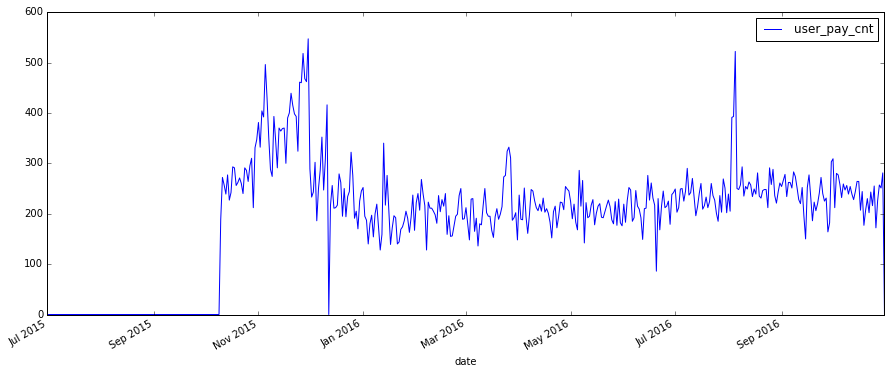

In [74]:
df_shop1.index = df_shop1['date']
df_shop1[['date', 'user_pay_cnt']].plot(kind='line', figsize=(15, 6)) 

In [80]:
# 分为训练集与测试集
df_train = df_shop1[(df_shop1.date >= '2016-08-01') & (df_shop1.date < '2016-09-01')]
# df_test = df_shop1[df_shop1.date < '2016-10-19']
df_test = df_shop1[df_shop1.date >= '2016-10-19']
print df_train[:3]

            shop_id       date  user_pay_cnt cate_3_name  weekday  month  \
date                                                                       
2016-08-01        1 2016-08-01           239       饮品/甜点        0      8   
2016-08-02        1 2016-08-02           205       饮品/甜点        1      8   
2016-08-03        1 2016-08-03           391       饮品/甜点        2      8   

            day_in_month  days_from_opening  is_workday  is_month_begin  \
date                                                                      
2016-08-01             1                296           1               1   
2016-08-02             2                297           1               1   
2016-08-03             3                298           1               1   

            is_month_end  is_holiday  is_specialDay  is_holi2workDay  \
date                                                                   
2016-08-01             0           0              0                0   
2016-08-02             0   

In [81]:
df_train = df_train[df_train.user_pay_cnt != 0]
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
y_train = df_train['user_pay_cnt'].values
X_train = df_train.drop(['shop_id', 'date', 'city_name', 'user_pay_cnt', 'cate_3_name'], axis = 1).values
y_test = df_test['user_pay_cnt'].values
X_test = df_test.drop(['shop_id', 'date', 'city_name', 'user_pay_cnt', 'cate_3_name'], axis = 1).values

model = RandomForestRegressor(n_estimators=100, n_jobs=4, random_state=2)
y_pred = model.fit(X_train, y_train).predict(X_test)
print evalue_score(y_pred, y_test)


0.154753511373


使用一个商店的数据进行训练，效果还不错的。但是多次试验发现使用不同月份来做训练集，对预测结果
的影响差异很大。

## 第三部分

In [82]:
df_pay = pd.read_csv(PATH + FILE_PAY_FULL)
df_pay['date'] = pd.to_datetime(df_pay['date'], format = '%Y-%m-%d')
df_pay['user_pay_cnt'] =  df_pay['user_pay_cnt'].apply(lambda x: int(x))

In [83]:
# 选取一个group中的所有商户的信息进行分析
df_pay = pd.merge(
    df_pay,
    df_shop[['shop_id','cate_3_name']],
    on = 'shop_id', how = 'left'
)
shop_type1 = list_cast3name[0]
df_shop_type1 = df_pay[df_pay.cate_3_name == shop_type1]
df_shop_type1.index = df_shop_type1['date']       
# 补充必要的信息
df_shop_type1 = fit_date_mess(df_shop_type1)

print df_shop_type1[:5]

            shop_id       date  user_pay_cnt cate_3_name  weekday  month  \
date                                                                       
2015-10-10        1 2015-10-10           188       饮品/甜点        5     10   
2015-10-11        1 2015-10-11           272       饮品/甜点        6     10   
2015-10-12        1 2015-10-12           257       饮品/甜点        0     10   
2015-10-13        1 2015-10-13           239       饮品/甜点        1     10   
2015-10-14        1 2015-10-14           277       饮品/甜点        2     10   

            day_in_month  
date                      
2015-10-10            10  
2015-10-11            11  
2015-10-12            12  
2015-10-13            13  
2015-10-14            14  


### 提取上面所有的特征

In [84]:
# 获取开业时间特征
open_date = []
for shop_id in df_shop_type1.shop_id.unique():
    open_date.append([shop_id, df_pay_withNan[df_pay_withNan.shop_id == df_shop_type1.iloc[0].shop_id]['date'].min()])
df_openDate = pd.DataFrame(open_date, columns = ['shop_id', 'open_date'])
df_openDate['open_date'] = pd.to_datetime(df_openDate['open_date'], format = '%Y-%m-%d')

df_shop_type1 = pd.merge(
    df_shop_type1,
    df_openDate,
    on = 'shop_id', how = 'left'
)

df_shop_type1['days_from_opening'] = (df_shop_type1['date'] - df_shop_type1['open_date']).dt.days
df_shop_type1 = df_shop_type1.drop(['open_date'], axis = 1)
print df_shop_type1[:5]

   shop_id       date  user_pay_cnt cate_3_name  weekday  month  day_in_month  \
0        1 2015-10-10           188       饮品/甜点        5     10            10   
1        1 2015-10-11           272       饮品/甜点        6     10            11   
2        1 2015-10-12           257       饮品/甜点        0     10            12   
3        1 2015-10-13           239       饮品/甜点        1     10            13   
4        1 2015-10-14           277       饮品/甜点        2     10            14   

   days_from_opening  
0                  0  
1                  1  
2                  2  
3                  3  
4                  4  


In [85]:
# 获得工作日、月前月末特征
df_shop_type1['is_workday'] = df_shop_type1['weekday'].apply(lambda x : 0 if x >= 5 else 1)
df_shop_type1['is_month_begin'] = df_shop_type1['day_in_month'].apply(lambda x : 1 if x <= 5 else 0)
df_shop_type1['is_month_end'] = df_shop_type1['day_in_month'].apply(lambda x : 1 if x >= 26 else 0)
print df_shop_type1[:5]

   shop_id       date  user_pay_cnt cate_3_name  weekday  month  day_in_month  \
0        1 2015-10-10           188       饮品/甜点        5     10            10   
1        1 2015-10-11           272       饮品/甜点        6     10            11   
2        1 2015-10-12           257       饮品/甜点        0     10            12   
3        1 2015-10-13           239       饮品/甜点        1     10            13   
4        1 2015-10-14           277       饮品/甜点        2     10            14   

   days_from_opening  is_workday  is_month_begin  is_month_end  
0                  0           0               0             0  
1                  1           0               0             0  
2                  2           1               0             0  
3                  3           1               0             0  
4                  4           1               0             0  


In [86]:
# 获得节假日特征
df_shop_type1['is_holiday'] = df_shop_type1['date'].apply(lambda x : 1 if x in holiday_list else 0)
df_shop_type1['is_specialDay'] = df_shop_type1['date'].apply(lambda x : 1 if x in specialDay_list else 0)
df_shop_type1['is_holi2workDay'] = df_shop_type1['date'].apply(lambda x : 1 if x in holi2workDay_list else 0)
df_shop_type1['is_springHoliday'] = df_shop_type1['date'].apply(lambda x : 1 if x in springHoliday_list else 0)
print df_shop_type1[:5]

   shop_id       date  user_pay_cnt cate_3_name  weekday  month  day_in_month  \
0        1 2015-10-10           188       饮品/甜点        5     10            10   
1        1 2015-10-11           272       饮品/甜点        6     10            11   
2        1 2015-10-12           257       饮品/甜点        0     10            12   
3        1 2015-10-13           239       饮品/甜点        1     10            13   
4        1 2015-10-14           277       饮品/甜点        2     10            14   

   days_from_opening  is_workday  is_month_begin  is_month_end  is_holiday  \
0                  0           0               0             0           0   
1                  1           0               0             0           0   
2                  2           1               0             0           0   
3                  3           1               0             0           0   
4                  4           1               0             0           0   

   is_specialDay  is_holi2workDay  is_spring

In [87]:
df_shop_type1 = pd.merge(
                df_shop_type1,
                df_shop[['shop_id', 'city_name']],
                on = ['shop_id'], how = 'left')

df_shop_type1 = pd.merge(
                df_shop_type1,
                df_pm_fit,
                on = ['date', 'city_name'], how = 'left')
print df_shop_type1[:5]

   shop_id       date  user_pay_cnt cate_3_name  weekday  month  day_in_month  \
0        1 2015-10-10           188       饮品/甜点        5     10            10   
1        1 2015-10-11           272       饮品/甜点        6     10            11   
2        1 2015-10-12           257       饮品/甜点        0     10            12   
3        1 2015-10-13           239       饮品/甜点        1     10            13   
4        1 2015-10-14           277       饮品/甜点        2     10            14   

   days_from_opening  is_workday  is_month_begin  is_month_end  is_holiday  \
0                  0           0               0             0           0   
1                  1           0               0             0           0   
2                  2           1               0             0           0   
3                  3           1               0             0           0   
4                  4           1               0             0           0   

   is_specialDay  is_holi2workDay  is_spring

In [88]:
# 分为训练集与测试集
df_train = df_shop_type1[(df_shop_type1.date >= '2016-04-01') & (df_shop_type1.date < '2016-09-01')]
# df_test = df_shop1[df_shop1.date < '2016-10-19']
df_test = df_shop_type1[df_shop_type1.date >= '2016-10-19']
print df_train[:3]

     shop_id       date  user_pay_cnt cate_3_name  weekday  month  \
173        1 2016-04-01           237       饮品/甜点        4      4   
174        1 2016-04-02           189       饮品/甜点        5      4   
175        1 2016-04-03           188       饮品/甜点        6      4   

     day_in_month  days_from_opening  is_workday  is_month_begin  \
173             1                174           1               1   
174             2                175           0               1   
175             3                176           0               1   

     is_month_end  is_holiday  is_specialDay  is_holi2workDay  \
173             0           0              0                0   
174             0           0              0                0   
175             0           0              0                0   

     is_springHoliday city_name   pm  
173                 0        湖州  108  
174                 0        湖州  124  
175                 0        湖州   59  


In [90]:
df_train = df_train[df_train.user_pay_cnt != 0]
y_train = df_train['user_pay_cnt'].values
X_train = df_train.drop(['shop_id', 'date', 'city_name', 'user_pay_cnt', 'cate_3_name'], axis = 1).values
y_test = df_test['user_pay_cnt'].values
X_test = df_test.drop(['shop_id', 'date', 'city_name', 'user_pay_cnt', 'cate_3_name'], axis = 1).values

model = RandomForestRegressor(n_estimators=200, n_jobs=4, random_state=2)
y_pred = model.fit(X_train, y_train).predict(X_test)
print evalue_score(y_pred, y_test), len(y_pred)

0.326491034866 871


如上所示，简单的groupby后拟合，效果十分差

## 第四部分

### 进行group内聚类再拟合

In [132]:
## 生成数据集
day_dt = pd.to_datetime(df_shop_type1['date'].unique().max()) - pd.to_datetime(df_shop_type1['date'].unique().min())
days = day_dt.days
len_sample = days + 1
print len_sample
shop_list = df_shop_type1['shop_id'].unique()
nShop = len(df_shop_type1['shop_id'].unique())
samples = np.zeros([nShop, len_sample])
for i in range(nShop):
    shop_cur = shop_list[i]
    df_temp = df_shop_type1[df_shop_type1.shop_id == shop_cur]
    df_temp.index = df_temp.date
    df_temp = df_temp.sort_index()
    sample = df_temp['user_pay_cnt'].values
    samples[i] = sample
    cnt = cnt + 1
    if (cnt % 500) == 0:
        print 'Finished %d shop' %(cnt)
print len(samples)

489
67


In [133]:
## 使用kmeans聚类
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
nCluster = 10
model_km = KMeans(n_clusters=nCluster, max_iter=300, random_state=None, n_jobs=4).fit(samples)

# 丢弃数量低于某个阈值的簇
cluster = {}
for i in range(nCluster):
    labels = pd.DataFrame(model_km.labels_, columns = ['label'])
    cluster[i] = Series(shop_list).iloc[labels[labels.label == i].index].values.tolist()

noise_cluster = []
noise_gate = 3
for i in cluster:
    if len(cluster[i]) < noise_gate:
        noise_cluster.append(i)
print 'cluster smaller than %d: %s' %(noise_gate, noise_cluster)

nSamlpeNotClustered = 0
sampleNotCluster = []
for i in cluster:
    if i in noise_cluster:
        nSamlpeNotClustered = nSamlpeNotClustered + len(cluster[i])
        sampleNotCluster.extend(cluster[i])
print '%d clusters least, %d samples were clustered' %(nCluster - len(noise_cluster), len(samples) - nSamlpeNotClustered)
print 'sample not clustered: %s' %(sampleNotCluster)

cluster smaller than 3: [3, 6, 7, 8, 9]
5 clusters least, 60 samples were clustered
sample not clustered: [1667L, 1945L, 723L, 1877L, 638L, 1621L, 1258L]


In [138]:
clusCnt = 0
y_preds = []
y_reals = []
for clus in cluster:
    print cluster[clus]
    df_clus = df_shop_type1[df_shop_type1.shop_id.isin(cluster[clus])]
    df_train = df_clus[(df_clus.date >= '2016-07-01') & (df_clus.date < '2016-09-01')]
    # df_train = df_shop1[df_shop1.date < '2016-10-19']
    df_test = df_clus[df_clus.date >= '2016-10-19']
    df_train = df_train[df_train.user_pay_cnt != 0]

    y_train = df_train['user_pay_cnt'].values
    X_train = df_train.drop(['shop_id', 'date', 'city_name', 'user_pay_cnt', 'cate_3_name'], axis = 1).values
    y_test = df_test['user_pay_cnt'].values
    X_test = df_test.drop(['shop_id', 'date', 'city_name', 'user_pay_cnt', 'cate_3_name'], axis = 1).values

    # model = RandomForestRegressor(n_estimators=100, n_jobs=4, random_state=2)
    model = GradientBoostingRegressor(max_depth = 5, max_features = 'sqrt')
    y_pred = model.fit(X_train, y_train).predict(X_test)
    print 'cluster %d' %clusCnt
    print evalue_score(y_pred, y_test), len(y_pred)
    y_preds.extend(y_pred.tolist())0
    y_reals.extend(y_test.tolist())
    clusCnt = clusCnt + 1
evalue_score(np.array(y_preds), np.array(y_reals)), len(y_pred)  

[150L, 165L, 280L, 501L, 547L, 635L, 725L, 920L, 923L, 1274L, 1278L, 1323L, 1691L, 1694L]
cluster 0
0.305024448671 182
[19L, 629L, 686L, 704L, 881L, 1301L, 1760L]
cluster 1
0.181138963655 91
[111L, 188L, 259L, 585L, 639L, 765L, 813L, 902L, 984L, 1164L, 1581L, 1868L]
cluster 2
0.209464068237 156
[1667L, 1945L]
cluster 3
0.140077418147 26
[1L, 370L, 402L, 862L, 1658L, 1960L]
cluster 4
0.205837670024 78
[209L, 227L, 284L, 428L, 432L, 466L, 760L, 770L, 907L, 1009L, 1040L, 1089L, 1100L, 1290L, 1318L, 1398L, 1444L, 1635L, 1668L, 1725L, 1952L]
cluster 5
0.264777371123 273
[723L, 1877L]
cluster 6
0.161499247757 26
[638L]
cluster 7
0.178360720862 13
[1621L]
cluster 8
0.670335289034 13
[1258L]
cluster 9
0.787134553972 13


(0.25501818739154736, 13)

聚类后的效果比不聚类的一个group要好一些，但是仍然太高。原因分析为：
- 一些特征没有one-hot
- 缺少前几天的客流量信息与店铺的客流量平均水平（月、周）
- 缺少view转化率特征
- 缺少客流量转化特征
- 聚类应添加其他商店特征
- 应选择与10月份最后几天情况类似的时间段作为训练集
如果要实现上面的方案，需要对缺失点进行修复，对缺失段忽视并修正训练集


In [103]:
def clusterDetect(labels):
    nSample = len(labels)
    cluster = {}
    # nCluster = len(set(labels))
    for i in set(labels):
        labels = pd.DataFrame(labels, columns = ['label'])
        cluster[i] = Series(shop_list).iloc[labels[labels.label == i]].values.tolist()

    noise_cluster = [-1]
    nSamlpeNotClustered = 0
    sampleNotCluster = []
    for i in cluster:
        if i in noise_cluster:
            nSamlpeNotClustered = nSamlpeNotClustered + len(cluster[i])
            sampleNotCluster.extend(cluster[i])
    print '%d samples were clustered' %(2000 - nSamlpeNotClustered)
    print 'sample not clustered: %s' %(sampleNotCluster)

#### 添加n天的转化率特征

In [ ]:
# 缺失点修复
def fit_0point():
    